In [1]:
!pip install PyDrive

from google.colab import drive
drive.mount('/content/drive')
!ls "/content/drive/My Drive/Colab Notebooks/GAN"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
celeba	svhn  Ver1_DCGAN_GP.ipynb


In [2]:
!ls "/content"

drive  None0000000.png	sample_data


In [3]:
%matplotlib inline

from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seem for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [0]:
# Root directory for dataset
dataroot = "/content/drive/My Drive/Colab Notebooks/GAN/svhn/"

# Number of workers for dataloader
workers = 4

# Batch size during training
batch_size = 64

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 32

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 50

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [5]:
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
from torch.utils.data import dataset
import torchvision.datasets as dset
import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML




datapath = '/content/drive/My Drive/Colab Notebooks/GAN/svhn'

image_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((.5, .5, .5),
                         (.5, .5, .5))
])


def get_data_loader(dataset_location, batch_size):
    trainvalid = torchvision.datasets.SVHN(
        dataset_location, split='train',
        download=True,
        transform=image_transform
    )

    trainset_size = int(len(trainvalid) * 0.9)
    trainset, validset = dataset.random_split(
        trainvalid,
        [trainset_size, len(trainvalid) - trainset_size]
    )

    trainloader = torch.utils.data.DataLoader(
        trainset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=2
    )

    validloader = torch.utils.data.DataLoader(
        validset,
        batch_size=batch_size,
    )

    testloader = torch.utils.data.DataLoader(
        torchvision.datasets.SVHN(
            dataset_location, split='test',
            download=True,
            transform=image_transform
        ),
        batch_size=batch_size,
    )

    return trainloader, validloader, testloader

trainloader, validloader, testloader = get_data_loader(datapath, batch_size)


# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")


Using downloaded and verified file: /content/drive/My Drive/Colab Notebooks/GAN/svhn/train_32x32.mat
Using downloaded and verified file: /content/drive/My Drive/Colab Notebooks/GAN/svhn/test_32x32.mat


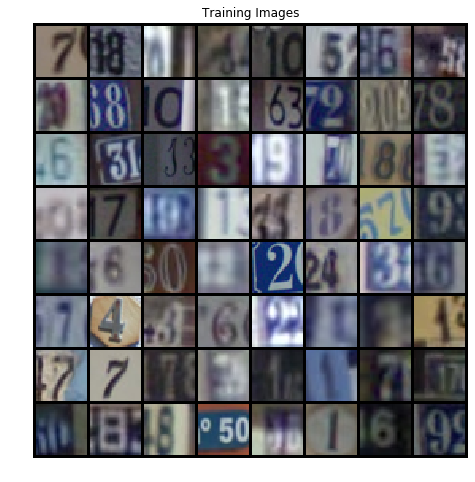

In [6]:
# Plot some training images
real_batch = next(iter(trainloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:batch_size], padding=2, normalize=True),(1,2,0)))

# Nouvelle section

# Nouvelle section

In [0]:
def dcgan_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('Norm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [0]:
class Generator(nn.Module):

    def __init__(self, f=32):
        super(Generator, self).__init__()

        # base depth nb of feature maps
        self.f = f

        def dc_block(in_size, out_size, k=4, s=2, p=1):
            return nn.Sequential(
                nn.ConvTranspose2d(in_size, out_size, k, s, p, bias=False),
                nn.BatchNorm2d(out_size),
                nn.ReLU(True))

        self.main = nn.Sequential(
            dc_block(100, self.f * 8, 2, 1, 0),
            dc_block(self.f * 8, self.f * 4),
            dc_block(self.f * 4, self.f * 2),
            dc_block(self.f * 2, self.f),
            nn.ConvTranspose2d(self.f, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )


    def forward(self, z):
        return self.main(z)

In [9]:
from torchsummary import summary

# Create the generator
netG = Generator().to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(dcgan_init)

noise = torch.randn(64, nz, 1, 1, device=device)

# Print the model
print(netG)
summary(netG, (100,1,1))

Generator(
  (main): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(100, 256, kernel_size=(2, 2), stride=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (1): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (2): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (3): Sequential(
      (0): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (4): Con

In [0]:
class Discriminator(nn.Module):
    def __init__(self, f=32):
        super(Discriminator, self).__init__()

        # base nb of feature maps
        self.f = f

        def conv_block(in_size, out_size, k=4, s=2, p=1):
            return nn.Sequential(
                nn.Conv2d(in_size, out_size, k, s, p, bias=False),
                nn.BatchNorm2d(out_size),  # No batch norm for WGAN-GP
                nn.LeakyReLU(0.2, inplace=True))

        self.main = nn.Sequential(
            nn.Conv2d(3, self.f, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            conv_block(self.f, self.f * 2),
            conv_block(self.f * 2, self.f * 4),
            conv_block(self.f * 4, self.f * 8),

            nn.Conv2d(self.f * 8, 1, 2, 1, 0, bias=False),
            nn.Sigmoid()  # Remove Sigmoid for WGAN-GP objective
        )

    def forward(self, x):
        return self.main(x)

In [11]:
# Create the Discriminator
netD = Discriminator().to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netD.apply(dcgan_init)

# Print the model
print(netD)
summary(netD, (3,32,32))

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Sequential(
      (0): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace)
    )
    (3): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace)
    )
    (4): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace)
    )
    (5): Conv2d(256, 1, kernel_size=(2, 2), stride=(1

In [0]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [13]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(trainloader, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        # Output training stats
        if i % 100 == 0:
            print('[%2d/%2d][%4d/%4d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(trainloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        iters += 1
    
    # saving fixed sample images
    with torch.no_grad():
      fake = netG(fixed_noise).detach().cpu()
      img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

Starting Training Loop...
[ 0/50][   0/1031]	Loss_D: 1.4142	Loss_G: 1.4398	D(x): 0.5037	D(G(z)): 0.5020 / 0.2451
[ 0/50][ 100/1031]	Loss_D: 0.5785	Loss_G: 5.3271	D(x): 0.9489	D(G(z)): 0.3976 / 0.0060
[ 0/50][ 200/1031]	Loss_D: 0.1617	Loss_G: 5.2036	D(x): 0.8921	D(G(z)): 0.0343 / 0.0065
[ 0/50][ 300/1031]	Loss_D: 0.1761	Loss_G: 4.3316	D(x): 0.9177	D(G(z)): 0.0791 / 0.0147
[ 0/50][ 400/1031]	Loss_D: 0.1453	Loss_G: 4.5078	D(x): 0.9493	D(G(z)): 0.0856 / 0.0134
[ 0/50][ 500/1031]	Loss_D: 0.4007	Loss_G: 3.4398	D(x): 0.8045	D(G(z)): 0.1392 / 0.0417
[ 0/50][ 600/1031]	Loss_D: 0.4359	Loss_G: 4.1441	D(x): 0.8510	D(G(z)): 0.2188 / 0.0182
[ 0/50][ 700/1031]	Loss_D: 0.3653	Loss_G: 3.3809	D(x): 0.8517	D(G(z)): 0.1347 / 0.0396
[ 0/50][ 800/1031]	Loss_D: 0.9841	Loss_G: 2.6419	D(x): 0.5609	D(G(z)): 0.1243 / 0.0965
[ 0/50][ 900/1031]	Loss_D: 1.5210	Loss_G: 5.4328	D(x): 0.3583	D(G(z)): 0.0062 / 0.0068
[ 0/50][1000/1031]	Loss_D: 0.3384	Loss_G: 3.3329	D(x): 0.8155	D(G(z)): 0.1052 / 0.0447
[ 1/50][   0/1031

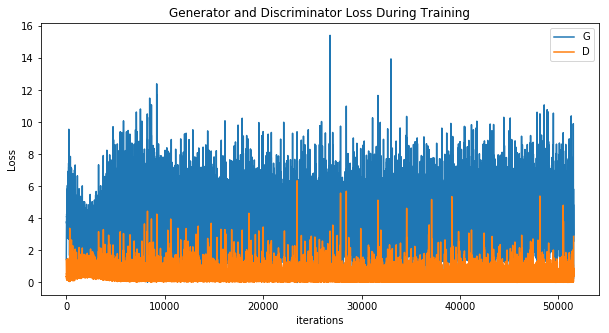

In [14]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

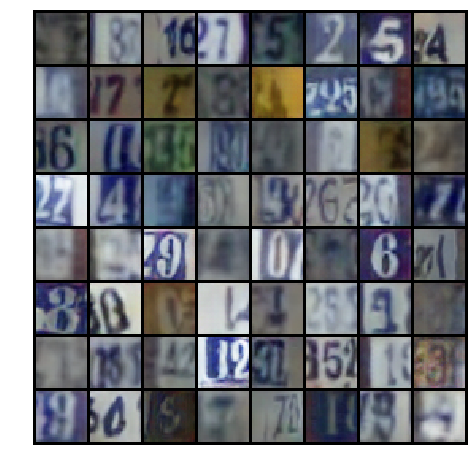

In [15]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

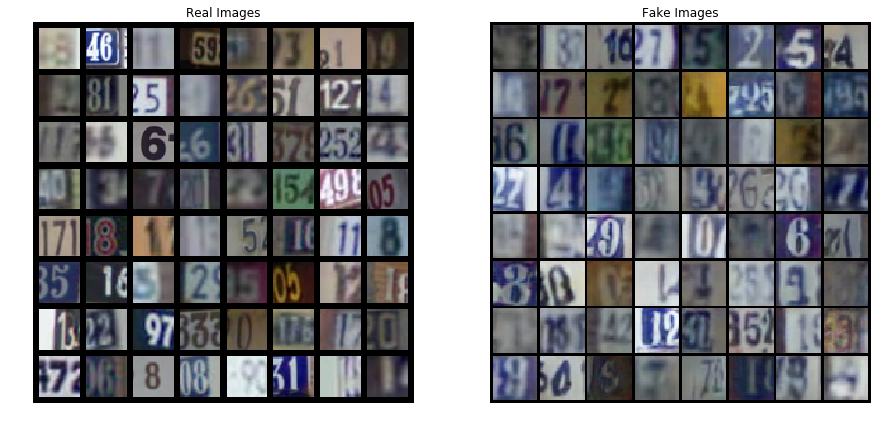

In [16]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(trainloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

#### Saving Model

In [0]:
G_filename = '/content/drive/My Drive/Colab Notebooks/GAN/dcgan-G'

torch.save(netG.state_dict(), G_filename)

D_filename = '/content/drive/My Drive/Colab Notebooks/GAN/dcgan-D'

torch.save(netD.state_dict(), D_filename)


In [0]:
import os

def save_samples(dir):
    G =  Generator().to(device)
    G.load_state_dict(torch.load(G_filename))
    G.eval()
    
    for p in G.parameters():
        p.requires_grad = False

    for i in range(10):
        print(i)
        noise = torch.randn(100, nz, 1, 1, device=device)
        images = G(noise)
        os.makedirs(f"{img_dir}/img/", exist_ok=True)
        for j, image in enumerate(images):
            filename = f"{img_dir}/img/{i * 100 + j:03d}.png"
            torchvision.utils.save_image(image, filename, normalize=True)

In [30]:
dcgan_samples = '/content/drive/My Drive/Colab Notebooks/GAN/dcgan_samples'

save_samples(dcgan_samples)


0
1
2
3
4
5
6
7
8
9


In [32]:
!ls '/content/drive/My Drive/Colab Notebooks/GAN/dcgan_samples/img'

000.png  112.png  224.png  336.png  448.png  560.png  672.png  784.png	896.png
001.png  113.png  225.png  337.png  449.png  561.png  673.png  785.png	897.png
002.png  114.png  226.png  338.png  450.png  562.png  674.png  786.png	898.png
003.png  115.png  227.png  339.png  451.png  563.png  675.png  787.png	899.png
004.png  116.png  228.png  340.png  452.png  564.png  676.png  788.png	900.png
005.png  117.png  229.png  341.png  453.png  565.png  677.png  789.png	901.png
006.png  118.png  230.png  342.png  454.png  566.png  678.png  790.png	902.png
007.png  119.png  231.png  343.png  455.png  567.png  679.png  791.png	903.png
008.png  120.png  232.png  344.png  456.png  568.png  680.png  792.png	904.png
009.png  121.png  233.png  345.png  457.png  569.png  681.png  793.png	905.png
010.png  122.png  234.png  346.png  458.png  570.png  682.png  794.png	906.png
011.png  123.png  235.png  347.png  459.png  571.png  683.png  795.png	907.png
012.png  124.png  236.png  348.png  460.png  572.png